In [1]:
! pip install numpy pandas pillow matplotlib scikit-learn opencv-python scikit-image pycocotools

In [2]:
import numpy, pandas, PIL, matplotlib, cv2, skimage, sklearn
from pycocotools.coco import COCO
print("All dependencies loaded successfully! 🚀")

All dependencies loaded successfully! 🚀


loading annotations into memory...
Done (t=1.08s)
creating index...
index created!
Total images: 5000
First 5 images: ['000000000139.jpg', '000000000285.jpg', '000000000632.jpg', '000000000724.jpg', '000000000776.jpg']
Last 5 images: ['000000581317.jpg', '000000581357.jpg', '000000581482.jpg', '000000581615.jpg', '000000581781.jpg']


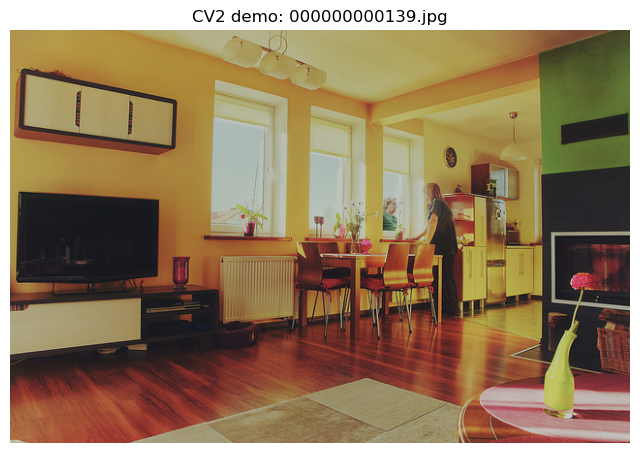

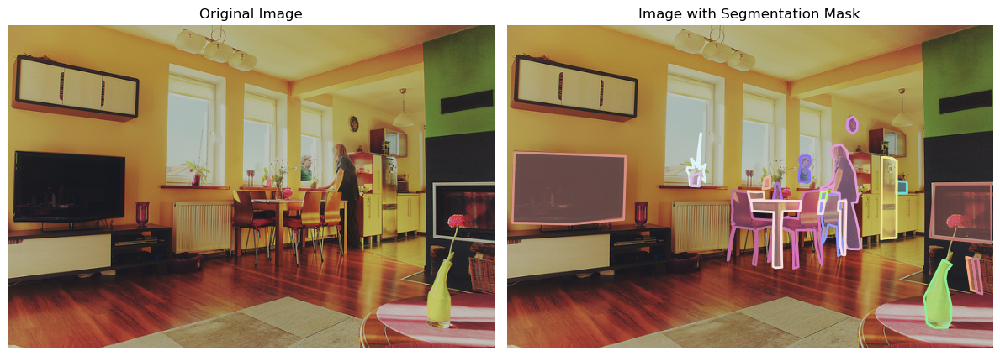

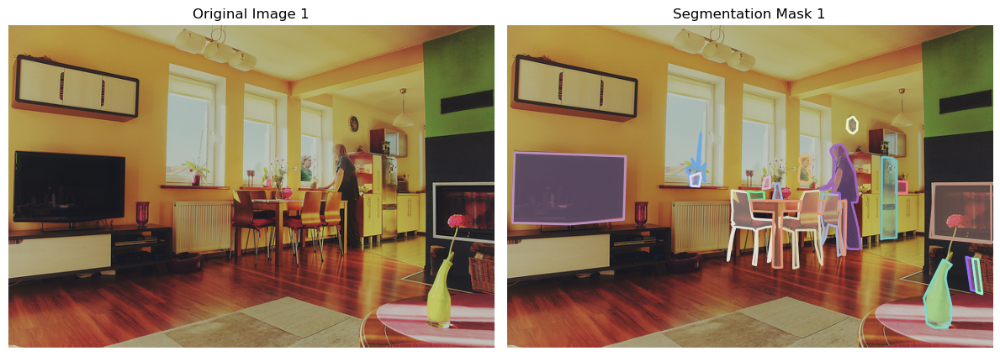

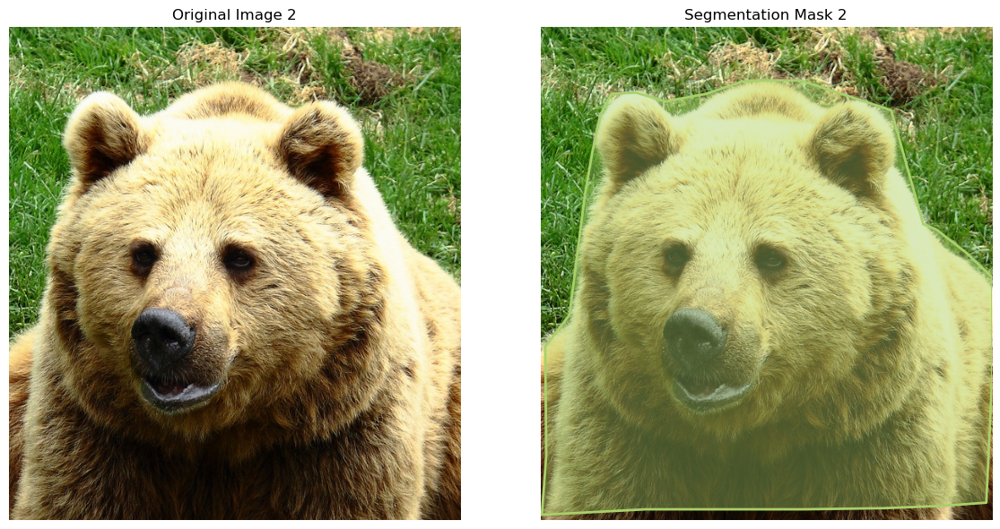

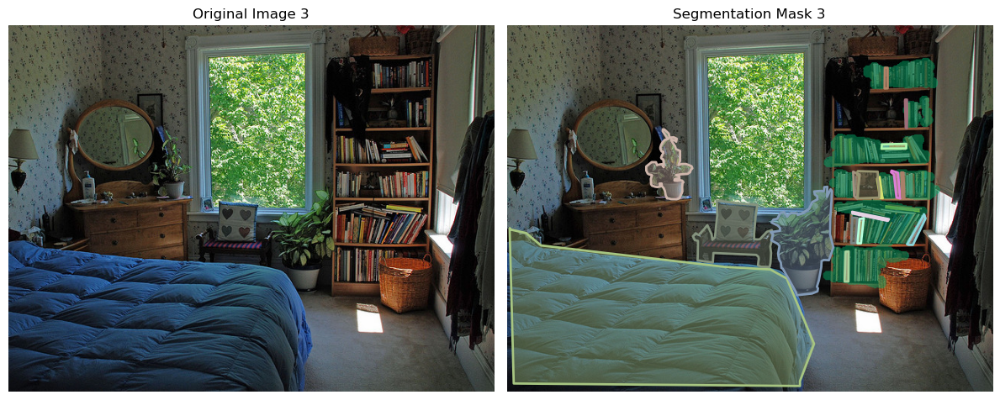

...

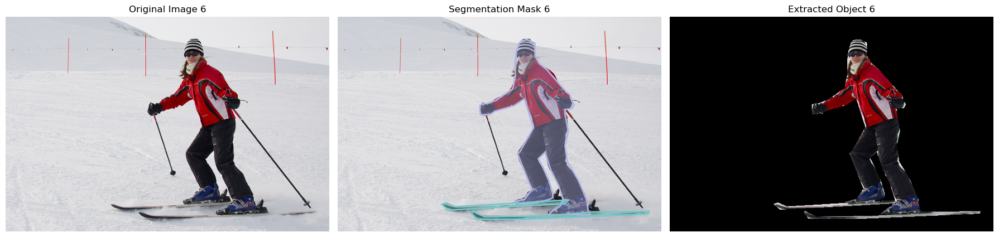

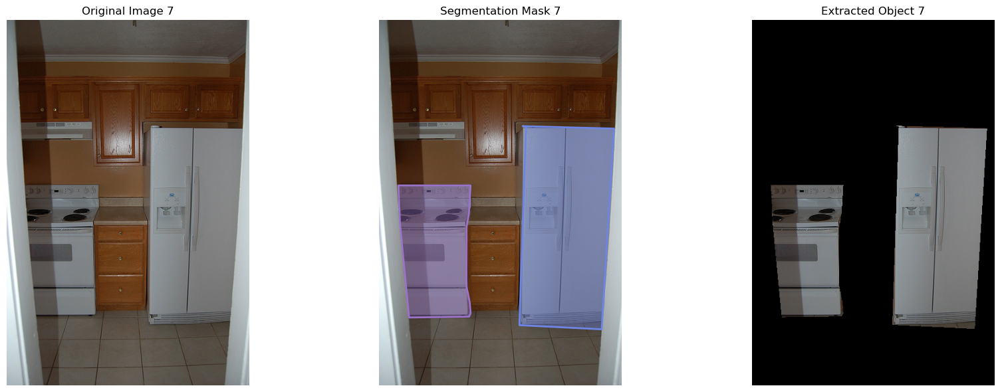

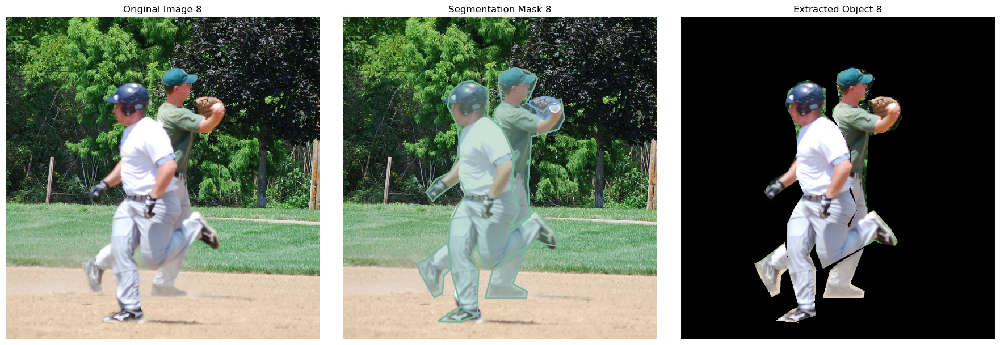

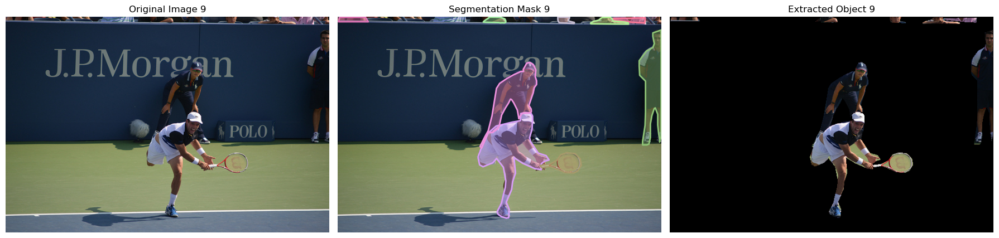

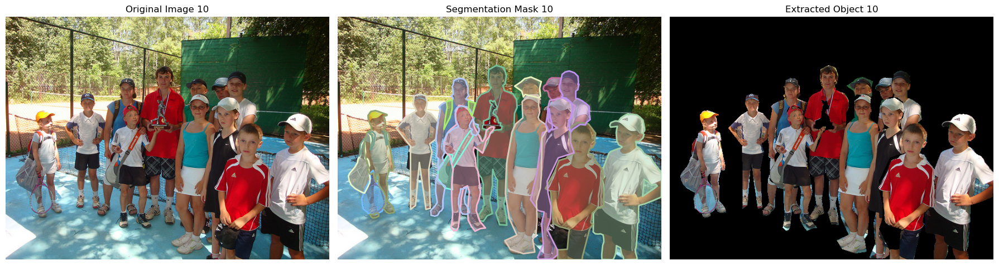

✅ Workflow finished. The same images were shown each run (deterministic selection).


In [3]:
# ! pip install numpy pandas pillow matplotlib scikit-learn
# ! pip install pycocotools

# --------------------------
# Imports (from your file)
# --------------------------
from pycocotools.coco import COCO
import os
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.model_selection import train_test_split

import cv2
import skimage.io as io
import random  # kept because it was in your original imports

# --------------------------
# Paths (from your file)
# --------------------------
annFile = r"D:\val2017\annotations\instances_val2017.json"
image_dir = r"D:\val2017\val2017"

# --------------------------
# Helper / connection: initialize COCO (this connects your COCO calls)
# --------------------------
# (In your original file you had COCO imported but later used coco... so we create it once here.)
if not os.path.exists(annFile):
    raise FileNotFoundError(f"Annotation file not found: {annFile}. Please check path.")
coco = COCO(annFile)

# --------------------------
# Simple directory checks (same as your original)
# --------------------------
filenames = os.listdir(image_dir)
print("Total images:", len(filenames))
print("First 5 images:", filenames[:5])
print("Last 5 images:", filenames[-5:])

# --------------------------
# 1) CV2 quick demo (your original example)
# --------------------------
# Use the same file name you used originally (keeps exact demo)
demo_name = "000000000139.jpg"
demo_path = os.path.join(image_dir, demo_name)

if os.path.exists(demo_path):
    # Read the image with OpenCV (BGR)
    img_cv2 = cv2.imread(demo_path)

    if img_cv2 is None:
        print(f"Warning: cv2 failed to read {demo_path}")
    else:
        # Convert BGR to RGB for matplotlib
        img_rgb = cv2.cvtColor(img_cv2, cv2.COLOR_BGR2RGB)

        # Show image
        plt.figure(figsize=(8, 6))
        plt.imshow(img_rgb)
        plt.axis("off")  # hide axis
        plt.title(f"CV2 demo: {demo_name}")
        plt.show()
else:
    print(f"Demo image not found at {demo_path} — skipping CV2 demo.")

# --------------------------
# Deterministic selection of images (no randomness now)
# --------------------------
# Your original code used random.choice and random.sample on coco.getImgIds().
# To make results deterministic, we'll sort the COCO image IDs and pick a fixed slice.
all_img_ids = coco.getImgIds()
all_img_ids_sorted = sorted(all_img_ids)  # deterministic order
NUM_TO_SHOW = 10
selected_img_ids = all_img_ids_sorted[:NUM_TO_SHOW]  # same images every run

# --------------------------
# 2) Show one image with segmentation mask (1x2), exactly like your first "random" block
# --------------------------
if len(selected_img_ids) > 0:
    img_id = selected_img_ids[0]  # deterministic "first" image
    img_info = coco.loadImgs(img_id)[0]

    # Load image with skimage (as in your file)
    img_path = os.path.join(image_dir, img_info["file_name"])
    img = io.imread(img_path)

    # Load annotations
    annIds = coco.getAnnIds(imgIds=img_info["id"])
    anns = coco.loadAnns(annIds)

    # Create side-by-side plots (Original | With Segmentation)
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Left: Original image
    axes[0].imshow(img)
    axes[0].axis("off")
    axes[0].set_title("Original Image")

    # Right: Image with segmentation mask
    axes[1].imshow(img)
    axes[1].axis("off")
    axes[1].set_title("Image with Segmentation Mask")

    # Force matplotlib to draw on the right axis (so coco.showAnns uses it)
    plt.sca(axes[1])
    coco.showAnns(anns)

    plt.tight_layout()
    plt.show()
else:
    print("No images found in COCO - cannot show segmentation demo.")

# --------------------------
# 3) Loop: show NUM_TO_SHOW deterministic images (1x2 each) - replaces your random-sample loop
# --------------------------
for i, img_id in enumerate(selected_img_ids, 1):
    img_info = coco.loadImgs(img_id)[0]
    img_path = os.path.join(image_dir, img_info["file_name"])
    img = io.imread(img_path)

    annIds = coco.getAnnIds(imgIds=img_info["id"])
    anns = coco.loadAnns(annIds)

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    axes[0].imshow(img)
    axes[0].axis("off")
    axes[0].set_title(f"Original Image {i}")

    axes[1].imshow(img)
    axes[1].axis("off")
    axes[1].set_title(f"Segmentation Mask {i}")

    # Draw COCO anns on the right axis (same technique you used)
    plt.sca(axes[1])
    coco.showAnns(anns)

    plt.tight_layout()
    plt.show()

# --------------------------
# 4) Loop: extract objects using union of masks and display (1x3), exactly like your extraction block
# --------------------------
for i, img_id in enumerate(selected_img_ids, 1):
    img_info = coco.loadImgs(img_id)[0]
    img_path = os.path.join(image_dir, img_info["file_name"])
    img = io.imread(img_path)

    annIds = coco.getAnnIds(imgIds=img_info["id"])
    anns = coco.loadAnns(annIds)

    # ---- Build union extraction mask (same code you had) ----
    mask = np.zeros((img.shape[0], img.shape[1]), dtype=np.uint8)
    for ann in anns:
        m = coco.annToMask(ann)
        mask = np.maximum(mask, m)

    extracted_object = img.copy()
    extracted_object[mask == 0] = 0  # background black (same as your code)

    # ---- Create side-by-side plots (Original | Mask Overlay | Extracted) ----
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Left: Original image
    axes[0].imshow(img)
    axes[0].axis("off")
    axes[0].set_title(f"Original Image {i}")

    # Middle: Segmentation mask overlay (using coco.showAnns on axis[1])
    axes[1].imshow(img)
    axes[1].axis("off")
    axes[1].set_title(f"Segmentation Mask {i}")
    plt.sca(axes[1])
    coco.showAnns(anns)

    # Right: Extracted object with black background
    axes[2].imshow(extracted_object)
    axes[2].axis("off")
    axes[2].set_title(f"Extracted Object {i}")

    plt.tight_layout()
    plt.show()

    # # Save extracted object (this line was in your original file, still commented)
    # save_path = f"extracted_object_{i}.jpg"
    # io.imsave(save_path, extracted_object)
    # print(f"✅ Extracted object saved as {save_path}")

# End of workflow
print("✅ Workflow finished. The same images were shown each run (deterministic selection).")
